# COVID_19 Analysis as of Mar. 5, 2020

In [1]:
import numpy as np
import pandas as pd

import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns

from plotnine import *
import calmap

import plotly.express as px
import folium

# color pallette
cdr = ['#393e46', '#ff2e63', '#30e3ca'] # grey - red - blue
idr = ['#f8b400', '#ff2e63', '#30e3ca'] # yellow - red - blue



Bad key "text.kerning_factor" on line 4 in
/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Dataset

### The file contains the cumulative count of confirmed, death and recovered cases of COVID-19 from different countries from 22nd January 2020.

In [2]:
full_table = pd.read_csv('covid_19_clean_complete.csv', parse_dates=['Date'])
full_table.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,Anhui,Mainland China,31.8257,117.2264,2020-01-22,1,0,0
1,Beijing,Mainland China,40.1824,116.4142,2020-01-22,14,0,0
2,Chongqing,Mainland China,30.0572,107.8740,2020-01-22,6,0,0
3,Fujian,Mainland China,26.0789,117.9874,2020-01-22,1,0,0
4,Gansu,Mainland China,36.0611,103.8343,2020-01-22,0,0,0


In [3]:
full_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7612 entries, 0 to 7611
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Province/State  4004 non-null   object        
 1   Country/Region  7612 non-null   object        
 2   Lat             7612 non-null   float64       
 3   Long            7612 non-null   float64       
 4   Date            7612 non-null   datetime64[ns]
 5   Confirmed       7612 non-null   int64         
 6   Deaths          7612 non-null   int64         
 7   Recovered       7612 non-null   int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 475.9+ KB


# Preprocessing

## Cleaning Data

In [4]:
# replacing Mainland China with just China
full_table['Country/Region'] = full_table['Country/Region'].replace('Mainland China', 'China')

# filling missing values with NA
full_table['Province/State'] = full_table['Province/State'].fillna('NA')


## Derived Tables

In [5]:
# cases in the Diamond Princess cruise ship
ship = full_table[full_table['Province/State'] == 'Diamond Princess cruise ship']
# cases not including Diamond Princess ship
full_table = full_table[full_table['Province/State'] != 'Diamond Princess cruise ship']
china = full_table[full_table['Country/Region'] == 'China']
row = full_table[full_table['Country/Region'] != 'China']

# data frame containing the data of the latest date
full_latest = full_table[full_table['Date'] == max(full_table['Date'])].reset_index()
# the latest case in China
china_latest = full_latest[full_latest['Country/Region'] == 'China']
# the latest case outside China
row_latest = full_latest[full_latest['Country/Region'] != 'China']

full_latest_grouped = full_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()
china_latest_grouped = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()
row_latest_grouped = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:17: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [6]:
full_latest_grouped

,Country/Region,Confirmed,Deaths,Recovered
0,Afghanistan,1,0,0
1,Algeria,12,0,0
2,Andorra,1,0,0
3,Argentina,1,0,0
4,Armenia,1,0,0
...,...,...,...,...
84,UK,115,1,8
85,US,221,12,8
86,Ukraine,1,0,0
87,United Arab Emirates,29,0,5


# Exploratory Data Analysis

## Latest Complete Data

In [7]:
# the place which has the maximum value of 'Confirmed','Death', 'Recovered' in the latest data
temp = full_latest.groupby(['Country/Region', 'Province/State'])['Confirmed', 'Deaths', 'Recovered'].max()
temp.style.background_gradient(cmap = 'Pastel1_r')

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



#### Hubei, China has the maximum value in 'Confirmed', 'Deaths', 'Recovered' as of Mar 5, 2020

## Latest Condensed Data

In [8]:
temp = full_table.groupby('Date')['Confirmed', 'Deaths', 'Recovered'].sum()
temp = temp.reset_index()
temp = temp.sort_values('Date', ascending = False)
temp.head(1).style.background_gradient(cmap='Pastel1')

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,Date,Confirmed,Deaths,Recovered
43,2020-03-05 00:00:00,97180,3342,53787


#### This is the total number in each column as of Mar 5, 2020

## World Wide Data

In [9]:
temp_f = full_latest_grouped[['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
# sort by 'Confirmed'
temp_f = temp_f.sort_values(by = 'Confirmed', ascending=False)
# drop the old index 
temp_f = temp_f.reset_index(drop=True)
temp_f.style.background_gradient(cmap='Pastel1_r')

,Country/Region,Confirmed,Deaths,Recovered
0,China,80422,3013,52240
1,South Korea,6088,35,41
2,Italy,3858,148,414
3,Iran,3513,107,739
4,Germany,482,0,16
5,France,377,6,12
6,Japan,360,6,43
7,Spain,259,3,2
8,US,221,12,8
9,Singapore,117,0,78


### Countries with deaths reported

In [10]:
temp_flg = full_latest_grouped[['Country/Region', 'Deaths']]
temp_flg = temp_flg.sort_values(by='Deaths', ascending=False)
temp_flg = temp_flg.reset_index(drop=True)
# Country with at least one death reported
temp_flg = temp_flg[temp_flg['Deaths']>0]
# heatmap
temp_flg.style.background_gradient(cmap='Reds')

,Country/Region,Deaths
0,China,3013
1,Italy,148
2,Iran,107
3,South Korea,35
4,US,12
5,Japan,6
6,France,6
7,Spain,3
8,Hong Kong,2
9,Australia,2


### Countries with no cases recovered

In [11]:
temp = full_latest_grouped[full_latest_grouped['Recovered'] == 0]
temp = temp[['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
# heatmap
temp.style.background_gradient(cmap='Reds')

,Country/Region,Confirmed,Deaths,Recovered
0,Sweden,94,0,0
1,Norway,87,0,0
2,Netherlands,82,0,0
3,Kuwait,58,0,0
4,Bahrain,55,0,0
5,Austria,41,0,0
6,Iraq,35,2,0
7,Iceland,34,0,0
8,Greece,31,0,0
9,San Marino,21,1,0


### Countries with all cases died

In [12]:
temp = row_latest_grouped[row_latest_grouped['Confirmed'] == row_latest_grouped['Deaths']]
temp = temp[['Country/Region', 'Confirmed', 'Deaths']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Reds')

,Country/Region,Confirmed,Deaths


### Countries with all the cases recovered

In [13]:
temp = row_latest_grouped[row_latest_grouped['Confirmed'] == row_latest_grouped['Recovered']]
temp = temp[['Country/Region', 'Confirmed', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Country/Region,Confirmed,Recovered
0,Vietnam,16,16
1,Cambodia,1,1
2,Nepal,1,1
3,Sri Lanka,1,1


### Countries with no affected case anymore

In [14]:
temp = row_latest_grouped[row_latest_grouped['Confirmed'] == 
                         row_latest_grouped['Deaths'] + row_latest_grouped['Recovered']]
temp = temp[['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap = 'Greens')

,Country/Region,Confirmed,Deaths,Recovered
0,Vietnam,16,0,16
1,Cambodia,1,0,1
2,Nepal,1,0,1
3,Sri Lanka,1,0,1


## Data from China

In [15]:
temp_f = china_latest_grouped[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp_f = temp_f.sort_values('Confirmed', ascending=False)
temp_f = temp_f.reset_index(drop=True)
temp_f.style.background_gradient(cmap='Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered
0,Hubei,67466,2902,40592
1,Guangdong,1351,7,1181
2,Henan,1272,22,1239
3,Zhejiang,1215,1,1124
4,Hunan,1018,4,938
5,Anhui,990,6,970
6,Jiangxi,935,1,901
7,Shandong,758,6,578
8,Jiangsu,631,0,583
9,Chongqing,576,6,512


### Province with no cases recovered

In [16]:
temp = china_latest_grouped[china_latest_grouped['Recovered'] == 0]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1_r')

,Province/State,Confirmed,Deaths,Recovered


### Province with all cases died

In [17]:
temp = china_latest_grouped[china_latest_grouped['Confirmed'] == china_latest_grouped['Deaths']]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Province/State,Confirmed,Deaths,Recovered


### Province with all cases recovered

In [18]:
temp = china_latest_grouped[china_latest_grouped['Confirmed'] == china_latest_grouped['Recovered']]
temp = temp[['Province/State', 'Confirmed', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Province/State,Confirmed,Recovered
0,Qinghai,18,18
1,Tibet,1,1


### Province with no affected case anymore

In [19]:
temp = china_latest_grouped[china_latest_grouped['Confirmed'] == 
                            china_latest_grouped['Deaths'] + china_latest_grouped['Recovered']]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')

,Province/State,Confirmed,Deaths,Recovered
0,Qinghai,18,0,18
1,Tibet,1,0,1


***

# Visual EDA

## Number of Confirmed and Deaths cases
<br> This does not include the Princess Diamond case

In [20]:
fig = px.bar(full_latest_grouped[['Country/Region', 'Confirmed']].sort_values('Confirmed', ascending=False),
            y='Confirmed', x='Country/Region', color='Country/Region',
            log_y=True, template='ggplot2', title='Confirmed Cases')
fig.show()

In [21]:
fig = px.bar(full_latest_grouped[['Country/Region', 'Deaths']].sort_values('Deaths', ascending=False),
            y='Deaths', x='Country/Region', color='Country/Region',
            log_y = True, template='ggplot2', title='Deaths')
fig.show()

## Across the globe

In [22]:
m = folium.Map(location=[0,0], tiles='cartodbpositron', min_zoom=1, max_zoom=4, zoom_start=1)

# this draws circles on a map
for i in range(0, len(full_latest)):
    folium.Circle(
        location = [full_latest.iloc[i]['Lat'], full_latest.iloc[i]['Long']],
        color = 'crimson',
        #  Display a text when hovering over the object
        tooltip = '<li><bold>Country : ' + str(full_latest.iloc[i]['Country/Region']) +
                  '<li><bold>Province : ' + str(full_latest.iloc[i]['Province/State']) + 
                  '<li><bold>Confirmed : ' + str(full_latest.iloc[i]['Confirmed']) +
                  '<li><bold>Deaths : ' + str(full_latest.iloc[i]['Deaths']) +
                  '<li><bold>Recovered : ' + str(full_latest.iloc[i]['Recovered']),
        # radius of the circle in meters
        radius = int(full_latest.iloc[i]['Confirmed']) 
    ).add_to(m)

m

## China

In [23]:
m = folium.Map(location=[30,116], tiles='cartodbpositron',
              min_zoom=2, max_zoom=5, zoom_start=3)

for i in range(0, len(china_latest)):
    folium.Circle(
        location = [china_latest.iloc[i]['Lat'], china_latest.iloc[i]['Long']],
        color='crimson',
        tooltip = '<li><bold>Country : ' + str(china_latest.iloc[i]['Country/Region']) +
                  '<li><bold>Province : ' + str(china_latest.iloc[i]['Province/State']) + 
                  '<li><bold>Confirmed : ' + str(china_latest.iloc[i]['Confirmed']) +
                  '<li><bold>Deaths : ' + str(china_latest.iloc[i]['Deaths']) +
                  '<li><bold>Recovered : ' + str(china_latest.iloc[i]['Recovered']),
        radius = int(china_latest.iloc[i]['Confirmed'])**1
    ).add_to(m)
    
m

## Affected Countries

In [24]:
# each row of data_frame is represented by a colored region mark on a map.
fig = px.choropleth(full_latest_grouped, locations='Country/Region',
                   locationmode='country names', color='Confirmed',
                   hover_name='Country/Region', range_color=[1, 2000],
                   color_continuous_scale='aggrnyl',
                   title='Countries with Confirmed Cases')
fig.update(layout_coloraxis_showscale=False)
fig.show()

#--------------------------------------------------------------------

fig = px.choropleth(full_latest_grouped[full_latest_grouped['Deaths']>0], 
                   locations='Country/Region',
                   locationmode='country names', color='Deaths',
                   hover_name='Country/Region', range_color=[1, 50],
                   color_continuous_scale='agsunset',
                   title='Countries with Deaths Reported')
fig.update(layout_coloraxis_showscale=False)
fig.show()

## Spread over the time
(does not include the cruise case)

In [25]:
# The max value of each columns of each country in each date
formated_gdf = full_table.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf = formated_gdf[formated_gdf['Country/Region'] != 'China']
formated_gdf['Date'] = pd.to_datetime(formated_gdf['Date'])
formated_gdf['Date'] = formated_gdf['Date'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Confirmed'].pow(0.5) # exponential power

fig = px.scatter_geo(formated_gdf[formated_gdf['Country/Region'] != 'China'],
                    locations='Country/Region', locationmode='country names',
                    color='Confirmed', size='size', hover_name='Country/Region',
                    range_color = [0, max(formated_gdf['Confirmed'])+2],
                    projection = 'natural earth', animation_frame='Date',
                    title = 'Spread outside China overtime')
fig.update(layout_coloraxis_showscale=False)
fig.show()

#----------------------------------------------------------------------

china_map = china.groupby(['Date', 'Province/State'])['Confirmed', 'Deaths', 'Recovered','Lat','Long'].max()
china_map = china_map.reset_index()
china_map['Date'] = pd.to_datetime(china_map['Date'])
china_map['Date'] = china_map['Date'].dt.strftime('%m/%d/%Y')
china_map['size'] = china_map['Confirmed'].pow(0.5) # exponential power

fig = px.scatter_geo(china_map, lat='Lat', lon ='Long', scope = 'asia',
                    color='size', size='size', hover_name='Province/State',
                    hover_data=['Confirmed', 'Deaths', 'Recovered'],
                    projection = 'natural earth', animation_frame='Date',
                    title = 'Spread in China overtime')
fig.update(layout_coloraxis_showscale=False)
fig.show()

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



## Number of Places to which COVID_19 Spread

In [26]:
# China
c_spread = china[china['Confirmed'] != 0].groupby('Date')['Province/State'].unique().apply(len)
c_spread = pd.DataFrame(c_spread).reset_index()

fig = px.line(c_spread, x='Date', y='Province/State',
             title='Number of Provinces/States/Regions of China to which COVID_19 spread over the time',
             color_discrete_sequence=cdr)
fig.show()

#---------------------------------------------------------

# Countries
spread = full_table[full_table['Confirmed'] != 0].groupby('Date')['Country/Region'].unique().apply(len)
spread = pd.DataFrame(spread).reset_index()

fig = px.line(spread, x='Date', y='Country/Region',
             title='Number of Countries/Regions to which COVID_19 spread over the time',
             color_discrete_sequence=cdr)
fig.show()

## Diamond Princess Cruise Ship
<br>
<li> The Diamond Princess ship was carrying 3,711 passengers and crew on board
<li> Ship arrived in Yokohama, near Tokyo, on Febrary 3

In [27]:
temp = ship.sort_values(by='Date', ascending=False).head(1)
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']].reset_index(drop=True)
temp.style.background_gradient(cmap='rainbow')

,Province/State,Confirmed,Deaths,Recovered
0,Diamond Princess cruise ship,706,6,10


In [28]:
# the latest data
temp = ship[ship['Date'] == max(ship['Date'])].reset_index()

m = folium.Map(location=[35.4437, 139.638], tiles = 'cartodbpositron',
              min_zoom=8, max_zoom=12, zoom_start=10)

folium.Circle(location=[temp.iloc[0]['Lat'], temp.iloc[0]['Long']],
             color='crimson',
             tooltip = '<li><bold>Ship : ' + str(temp.iloc[0]['Province/State'])+
                       '<li><bold>Confirmed : ' + str(temp.iloc[0]['Confirmed']) + 
                       '<li><bold>Deaths : ' + str(temp.iloc[0]['Deaths']) +
                       '<li><bold>Recovered : ' + str(temp.iloc[0]['Recovered']),
             radius=int(temp.iloc[0]['Confirmed'])**1).add_to(m)
m

## Cases over the time

In [29]:
temp = full_table.groupby(['Country/Region', 'Date'])['Confirmed', 'Deaths', 'Recovered'].sum()
temp = temp.reset_index()

fig = px.bar(temp, x='Date', y='Confirmed', color='Country/Region', orientation='v', height=600,
            title='Confirmed', color_discrete_sequence=px.colors.cyclical.mygbm)
fig.show()

#--------------------------------------------------------------

fig = px.bar(temp, x='Date', y='Deaths', color='Country/Region', orientation='v', height=600,
            title='Deaths', color_discrete_sequence=px.colors.cyclical.mygbm)
fig.show()

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



## Spread over the time

In [30]:
gdf = full_table.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
gdf = gdf.reset_index()

# case China
temp = gdf[gdf['Country/Region'] == 'China'].reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x='Date', y='Count', color='Case', facet_col='Case',
            title='Cases in China', color_discrete_sequence=cdr)
fig.show()

# -------------------------------------------------------------------------

# case Outside China
temp = gdf[gdf['Country/Region'] != 'China'].groupby('Date').sum().reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x='Date', y='Count', color='Case', facet_col='Case',
            title='Cases Outside China', color_discrete_sequence=cdr)
fig.show()


/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



## Hubei - China - World

In [31]:
def location(row):
    if row['Country/Region'] == 'China':
        if row['Province/State'] == 'Hubei':
            return 'Hubei'
        else:
            return 'Other Chinese Provinces'
    else:
        return 'Rest of the World'
    
temp = full_table.copy()
temp['Region'] = temp.apply(location, axis=1)
temp['Date'] = temp['Date'].dt.strftime('%Y-%m-%d')
temp = temp.groupby(['Region', 'Date'])['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()
temp = temp.melt(id_vars=['Region', 'Date'], value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count').sort_values('Count')
temp = temp.sort_values(['Date', 'Region', 'Case']).reset_index()

fig = px.bar(temp, y='Region', x='Count', color='Case', barmode='group', orientation='h',
            text='Count', title='Hubei - China - World', animation_frame='Date',
            color_discrete_sequence=['#EF553B', '#00CC96', '#636EFA'], range_x=[0, 70000])

fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.update_layout(yaxis={'categoryorder':'array',
                        'categoryarray':['Hubei', 'Other Chinese Provinces', 'Rest of the World']})
fig.show()

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



# Number of new cases everyday

In [32]:
# China
temp = china.groupby('Date')['Confirmed', 'Deaths', 'Recovered'].sum().diff()
temp = temp.reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed','Deaths','Recovered'])

fig = px.bar(temp, x='Date', y='value', color='variable',
            title='In China', color_discrete_sequence=cdr)
fig.update_layout(barmode='group')
fig.show()

#----------------------------------------------------------------------------------

temp = row.groupby('Date')['Confirmed', 'Deaths', 'Recovered'].sum().diff()
temp = temp.reset_index()
temp = temp.melt(id_vars='Date', value_vars=['Confirmed', 'Deaths', 'Recovered'])

fig = px.bar(temp, x='Date', y='value', color='variable',
            title='Outside China', color_discrete_sequence=cdr)
fig.update_layout(barmode='group')
fig.show()

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



## Recovery and Mortality Rate Over The Time

In [33]:
temp = full_table.groupby('Date').sum().reset_index()

temp['No. of Deaths to 100 Confirmed Cases'] = round(temp['Deaths']/temp['Confirmed'], 3)*100
temp['No. of Recovered to 100 Confirmed Cases'] = round(temp['Recovered']/temp['Confirmed'], 3)*100
temp['No. of Recovered to 1 Death Case'] = round(temp['Recovered']/temp['Deaths'], 3)

temp = temp.melt(id_vars='Date', value_vars=['No. of Deaths to 100 Confirmed Cases',
                                            'No. of Recovered to 100 Confirmed Cases',
                                            'No. of Recovered to 1 Death Case'],
                var_name='Ratio', value_name='Value')

fig = px.line(temp, x='Date', y='Value', color='Ratio',
            title='Recovery and Mortality Rate Over The Time', color_discrete_sequence=cdr)
fig.show()

### Notice:
<li><bold> During the first few weeks there were more Deaths reported per day then Recovered Cases
<li><bold> Over the time that has changed drastically
<li><bold> Although the death rate hasn't come down, the number of recovered cases has definetely increased

## Proportion of Cases

In [34]:
# Outside China
rl = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered'].sum()
rl = rl.reset_index().sort_values(by='Confirmed', ascending=False).reset_index(drop=True)

ncl = rl.copy()
ncl['Affected'] = ncl['Confirmed'] - ncl['Deaths'] - ncl['Recovered']
ncl = ncl.melt(id_vars='Country/Region', value_vars=['Affected', 'Recovered', 'Deaths'])

fig = px.bar(ncl.sort_values(['variable', 'value']), x='Country/Region', y='value',
            color='variable', orientation='v', height=600, title='Number of Cases outside China',
            color_discrete_sequence=cdr)
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

# ----------------------------------------------

# China
cl = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered'].sum()
cl = cl.reset_index().sort_values('Confirmed', ascending=False).reset_index(drop=True)

ncl = cl.copy()
ncl['Affected'] = ncl['Confirmed'] - ncl['Deaths'] - ncl['Recovered']
ncl = ncl.melt(id_vars='Province/State', value_vars=['Affected', 'Recovered', 'Deaths'])

fig = px.bar(ncl.sort_values(['variable', 'value']), y='Province/State', x='value',
            color='variable', orientation='h', height=800, title='Number of Cases in China',
            color_discrete_sequence=cdr)
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [35]:
# A treemap plot represents hierarchial data as nested rectangular sectors.

## China
# Confirmed
fig = px.treemap(china_latest,
                path=['Province/State'], values='Confirmed', height=500, width=600,
                title='Number of Confirmed Cases in Chinese Provinces',
                color_discrete_sequence=px.colors.qualitative.Prism)
fig.show()

# Deaths
fig = px.treemap(china_latest.sort_values('Deaths', ascending=False).reset_index(drop=True),
                path=['Province/State'], values='Deaths', height=500, width=600,
                title='number of Deaths Reported in Chinese Provinces',
                color_discrete_sequence=px.colors.qualitative.Prism)
fig.show()

# Recovered
fig = px.treemap(china_latest.sort_values('Recovered', ascending=False).reset_index(drop=True),
                path=['Province/State'], values='Recovered', height=500, width=600,
                title='number of Recovered Cases in Chinese Provinces',
                color_discrete_sequence=px.colors.qualitative.Prism)
fig.show()

# -----------------------------------------------------------

## Outside China
# Confirmed
fig = px.treemap(row_latest, path=['Country/Region'], values='Confirmed', height=500, width=600,
                title='number of Confirmed Cases Outside China',
                color_discrete_sequence=px.colors.qualitative.Pastel)
fig.show()

# Deaths
fig = px.treemap(row_latest, path=['Country/Region'], values='Deaths', height=500, width=600,
                title='number of Deaths Outside China',
                color_discrete_sequence=px.colors.qualitative.Pastel)
fig.show()

# Recovered
fig = px.treemap(row_latest, path=['Country/Region'], values='Recovered', height=500, width=600,
                title='number of Recovered Cases Outside China',
                color_discrete_sequence=px.colors.qualitative.Pastel)
fig.show()

In [36]:
temp = full_table.groupby(['Country/Region', 'Date'])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()

# When the country name changes
mask = temp['Country/Region'] != temp['Country/Region'].shift(1)

# Let the value when the country name changes be NAN
temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

# All countries
fig = px.bar(temp, x='Date', y='Confirmed', color='Country/Region',
            title='Number of new cases everyday')
fig.show()

# Outside China
fig = px.bar(temp[temp['Country/Region'] != 'China'], x='Date', y='Confirmed',
            color='Country/Region', title='Number of new cases outside China everyday')
fig.show()


fig = px.bar(temp, x='Date', y='Deaths', color='Country/Region',
            title='Number of new death case reported everyday')
fig.show()

fig = px.bar(temp[temp['Country/Region'] != 'China'], x='Date', y='Deaths',
            color='Country/Region', title='Number of new death case reported outside China everyday')
fig.show()

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



## Confirmed cases in each Countries

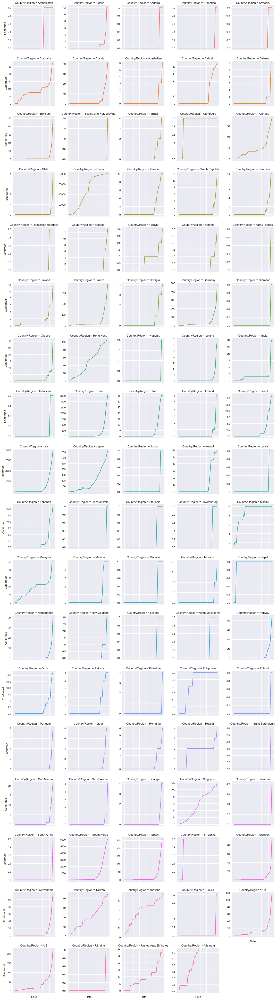

In [37]:
temp = full_table.groupby(['Date', 'Country/Region'])['Confirmed'].sum()
temp = temp.reset_index().sort_values(by=['Date','Country/Region'])

plt.style.use('seaborn')
g = sns.FacetGrid(temp, col='Country/Region', hue='Country/Region',
                 sharey=False, col_wrap=5)
g = g.map(plt.plot, 'Date', 'Confirmed')
g.set_xticklabels(rotation=90)
plt.show()

## New cases in each Countries

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



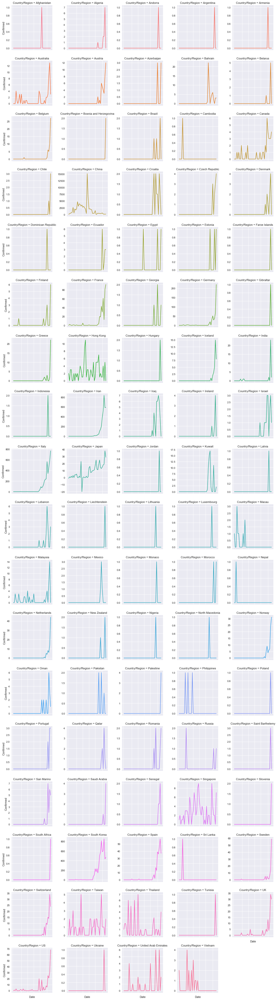

In [38]:
temp = full_table.groupby(['Country/Region', 'Date'])['Confirmed','Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()

mask = temp['Country/Region'] != temp['Country/Region'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths']= np.nan
temp.loc[mask, 'Recovered'] = np.nan

plt.style.use('seaborn')
g = sns.FacetGrid(temp, col='Country/Region', hue='Country/Region', sharey=False, col_wrap=5)
g = g.map(sns.lineplot, 'Date', 'Confirmed')
g.set_xticklabels(rotation=90)
plt.show()

***

## New Cases Everyday

In [39]:
def from_china_or_not(row):
    if row['Country/Region'] == 'China':
        return 'From China'
    else:
        return 'Outside China'

temp = full_table.copy()
temp['Region'] = temp.apply(from_china_or_not, axis=1)
temp = temp.groupby(['Region', 'Date'])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()

mask = temp['Region'] != temp['Region'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

fig = px.bar(temp, x='Date', y='Confirmed', color='Region', barmode='group',
            text='Confirmed', title='Confirmed', color_discrete_sequence=cdr)
fig.update_traces(textposition='outside')
fig.show()

fig = px.bar(temp, x='Date', y='Deaths', color='Region', barmode='group',
            text='Confirmed', title='Deaths', color_discrete_sequence=cdr)
fig.update_traces(textposition='outside')
fig.update_traces(textangle=-90)
fig.show()

/Users/ayumi.matsuoka/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



### Number of new cases everyday

AttributeError: 'DataFrame' object has no attribute 'ix'

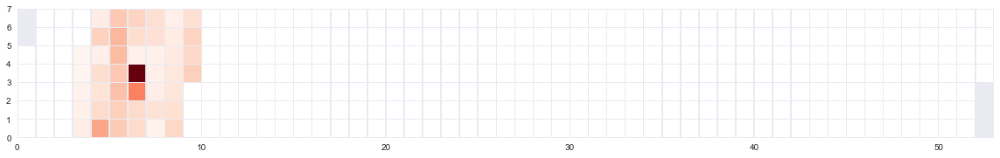

In [40]:
temp = full_table.groupby('Date')['Confirmed'].sum()
temp = temp.diff()

plt.figure(figsize=(20,5))
calmap.yearplot(temp, fillcolor='white', cmap='Reds', linewidth=0.5)

plt.plot()

### Number of new countries every day

In [ ]:
spread = full_table[full_table['Confirmed']!=0].groupby('Date')
spread = spread['Country/Region'].unique().apply(len).diff()

plt.figure(figsize=(20,5))
calmap.yearplot(spread, fillcolor='white', cmap='Greens', linewidth=0.5)

plt.plot()